<center>
    <img src="https://github.com/TUIlmenauAMS/MLfAS_Tutorials/blob/main/images/mlfasp.png?raw=1">
</center>

#### Prof. Dr. -Ing. Gerald Schuller <br> Jupyter Notebook: Renato Profeta

[Applied Media Systems Group](https://www.tu-ilmenau.de/en/applied-media-systems-group/) <br>
[Technische Universität Ilmenau](https://www.tu-ilmenau.de/)

# Denoising Autoencoder

In [ ]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/RRo8sLTCc2M?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

The "Denoising Autoencoder" is basically the same as an Autoencoder, but instead of having a clean audio signal as its input, it has a noisy version.

Usually this noisy version has added noise, but it could also be other kinds of distortions.

The goal of the denoising Autoencoder is then to reconstruct the clean version of its input. Hence it is trained on noisy signals as trainings set. To avoid that the denoising Autoencoder learns a specific instance of the noise, an new instance of the noise is generated for each epoch of the training process.

So for our example we use the same autoencoder structure as before, and train it with an added noise.

The training 'for' loop then contains:
```python
Ypred=model(X+torch.randn(X.size())*0.05)```

To make it shift invariant, we can also include a cyclic ("round robin") shift as another type of distortion in the trainings loop, for the input X and the target Y:

```python
Xlast=X[:,:,-1].clone()
X[:,:,1:]=X[:,:,:-1].clone()
#round Robbin, shift 1 right
X[:,:,0]=Xlast.clone()
Ylast=Y[:,:,-1].clone()
Y[:,:,1:]=Y[:,:,:-1].clone()
#round Robbin, shift 1 right
Y[:,:,0]=Ylast.clone()```

The training then continues as usual with:
```python
Ypred=model(X)
loss=loss_fn(Ypred, Y)
if epoch%10==0:
    print(epoch, loss.item())
optimizer.zero_grad()
loss.backward()
optimizer.step()```

## Experiment 1 with stride=512

In [ ]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/u4hmSXiXI6I?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

In [ ]:
# -*- coding: utf-8 -*-
__author__ = 'Gerald Schuller'
__copyright__ = 'G.S.'

"""
convolutional autoencoder for audio signals.
Gerald Schuller, February 2020.
""";
# Ported to Jupyter Notebook by Renato Profeta, November 2020

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import librosa

In [ ]:
if sys.version_info[0] < 3:
   # for Python 2
   import cPickle as pickle
else:
   # for Python 3
   import pickle

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device=", device)

device= cpu


In [ ]:
def signal2pytorch(x):
    #Function to convert a signal vector x, like a mono audio signal, into a 3-d Tensor that conv1d of Pytorch expects,
    #https://pytorch.org/docs/stable/nn.html
    #Argument x: a 1-d signal as numpy array
    #input x[batch,sample]
    #output: 3-d Tensor X for conv1d input.
    #for conv1d Input: (N,Cin,Lin), Cin: numer of input channels (e.g. for stereo), Lin: length of signal, N: number of Batches (signals)
    X = np.expand_dims(x, axis=0)  #add channels dimension (here only 1 channel)
    if len(x.shape)==1: #mono:
        X = np.expand_dims(X, axis=0)  #add batch dimension (here only 1 batch)
    X=torch.from_numpy(X)
    X=X.type(torch.Tensor)
    X=X.permute(1,0,2)  #make batch dimension first
    return X

In [ ]:
class Convautoenc(nn.Module):
    def __init__(self):
        super(Convautoenc, self).__init__()
        #Analysis Filterbank with downsampling of N=1024, filter length of 2N, but only N/2 outputs:
        self.conv1=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=2048, stride=512, padding=1023, bias=True) #Padding for 'same' filters (kernel_size/2-1)

        #Synthesis filter bank:
        self.synconv1=nn.ConvTranspose1d(in_channels=32, out_channels=1, kernel_size=2048, stride=512, padding=1023, bias=True)

    def encoder(self, x):
        #Analysis:
        x = self.conv1(x)
        y = torch.tanh(x)
        return y

    def decoder(self, y):
        #Synthesis:
        xrek= self.synconv1(y)
        return xrek

    def forward(self, x):
        y=self.encoder(x)
        #y=torch.round(y/0.125)*0.125
        xrek=self.decoder(y)
        return xrek

In [ ]:
batch=1
audio, samplerate = librosa.load("./audio/ACDC - Back In Black Intro.wav", mono=False, sr=None, offset=6)
audio[0,:]/=np.abs(audio[0,:]).max()
audio[1,:]/=np.abs(audio[1,:]).max()
X_train=signal2pytorch(audio[0,:]).to(device) #Convert to pytorch format, batch is first dimension
X_test=signal2pytorch(audio[1,:]).to(device) #Convert to pytorch format, batch is first dimension

In [ ]:
print("Generate Model:")
model = Convautoenc().to(device)
print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
print("Def. loss function:")
loss_fn = nn.MSELoss()  #MSE
#loss_fn = nn.L1Loss()

Ypred=model(X_train)

#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)

Y=X_train[:,:,:outputlen]  #the target signal with same length as model output

print("Input X.shape=", X_train.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())

Generate Model:
Total number of parameters: 131105
Def. loss function:
outputlen= 881666
Input X.shape= torch.Size([1, 1, 882000])
Target Y.shape= torch.Size([1, 1, 881666])
Target Y= tensor([[[-0.0021,  0.0010,  0.0031,  ..., -0.0969, -0.0991, -0.0316]]])
Y.type()= torch.FloatTensor


In [ ]:
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
""";

#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
Ypred=model(X_train)
#Ypred=Ypred.detach()
print("Ypred=", Ypred)

#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

if randdir==True:
#optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X_train, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(4000):
        #distortions: shift and noise:
        #"""
        Xlast=X_train[:,:,-1].clone()
        X_train[:,:,1:]=X_train[:,:,:-1].clone() #round Robbin, shift 1 right
        X_train[:,:,0]=Xlast.clone()
        Ylast=Y[:,:,-1].clone()
        Y[:,:,1:]=Y[:,:,:-1].clone() #round Robbin, shift 1 right
        Y[:,:,0]=Ylast.clone()
        #"""
        Ypred=model(X_train+torch.randn(X_train.size())*0.05)
        #print("Ypred.shape=", Ypred.shape)
        #loss wants batch in the beginning! (Batch, Classes,...)
        #Ypredp=Ypred.permute(1,2,0)
        #Yp=Y.permute(1,0)
        #print("Ypredp.shape=", Ypredp.shape, "Yp.shape=", Yp.shape )
        loss=loss_fn(Ypred, Y)
        if epoch%10==0:
            print(epoch, loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

Ypred= tensor([[[-0.0190, -0.0180, -0.0157,  ..., -0.0212, -0.0065, -0.0206]]],
       grad_fn=<SqueezeBackward1>)
0 0.013352341018617153
10 0.012862831354141235
20 0.012160955928266048
30 0.011200959794223309
40 0.010244246572256088
50 0.009432852268218994
60 0.008802765049040318
70 0.008316658437252045
80 0.00792553648352623
90 0.007609034422785044
100 0.007346763741225004
110 0.007119739893823862
120 0.006911209784448147
130 0.006737849675118923
140 0.006585194729268551
150 0.006428615655750036
160 0.006294948048889637
170 0.006155227776616812
180 0.006028967909514904
190 0.005917465779930353
200 0.005803132429718971
210 0.005688117351382971
220 0.005582151934504509
230 0.005491285584867001
240 0.00540688494220376
250 0.005317679140716791
260 0.00522645702585578
270 0.005161253269761801
280 0.0050811730325222015
290 0.005030422005802393
300 0.0049554649740457535
310 0.004896650090813637
320 0.0048430138267576694
330 0.004784946795552969
340 0.004731804132461548
350 0.004681853111833

3110 0.002820009598508477
3120 0.0028259665705263615
3130 0.0028171204030513763
3140 0.0028240587562322617
3150 0.0028208205476403236
3160 0.00281317625194788
3170 0.0028242298867553473
3180 0.0028246555011719465
3190 0.0028295661322772503
3200 0.0028193064499646425
3210 0.0028186957351863384
3220 0.0028238692320883274
3230 0.002819962566718459
3240 0.002833278151229024
3250 0.0028329086489975452
3260 0.0028267500456422567
3270 0.0028244550339877605
3280 0.002804572694003582
3290 0.002822906244546175
3300 0.0028153664898127317
3310 0.0027993801049888134
3320 0.0028255621436983347
3330 0.002823947463184595
3340 0.0028196044731885195
3350 0.0028239539824426174
3360 0.0028172365855425596
3370 0.0028219998348504305
3380 0.002821136498823762
3390 0.002828589640557766
3400 0.002827148651704192
3410 0.002821182832121849
3420 0.0028088544495403767
3430 0.0028269626200199127
3440 0.002822920447215438
3450 0.002821414964273572
3460 0.0028267516754567623
3470 0.00281739654019475
3480 0.0028259041

ww= OrderedDict([('conv1.weight', tensor([[[-0.0158, -0.0108, -0.0075,  ...,  0.0001,  0.0028,  0.0021]],

        [[-0.0148, -0.0085, -0.0037,  ..., -0.0113, -0.0154, -0.0165]],

        [[-0.0051, -0.0020,  0.0002,  ...,  0.0165,  0.0123,  0.0112]],

        ...,

        [[-0.0187, -0.0164, -0.0153,  ..., -0.0051, -0.0041, -0.0059]],

        [[ 0.0017,  0.0010,  0.0023,  ..., -0.0042, -0.0024,  0.0012]],

        [[ 0.0120,  0.0094,  0.0068,  ...,  0.0132,  0.0080, -0.0005]]])), ('conv1.bias', tensor([ 2.5182e-04,  3.3436e-04,  3.2975e-05, -2.4693e-04,  1.3294e-04,
         1.4874e-04, -3.0770e-04,  9.7038e-05, -6.7553e-04,  3.5961e-05,
        -4.0365e-04, -8.4402e-04,  2.2880e-04, -1.9787e-04,  4.5090e-05,
        -1.0172e-04,  2.8192e-04, -2.4518e-05, -9.7425e-05,  6.6026e-05,
         8.8188e-05,  1.6416e-04, -8.2219e-05, -2.5248e-04, -2.3354e-04,
         1.2006e-04, -2.6631e-05, -4.1153e-05, -1.4597e-04,  4.5869e-04,
         1.0430e-04, -2.0452e-04])), ('synconv1.weight', te

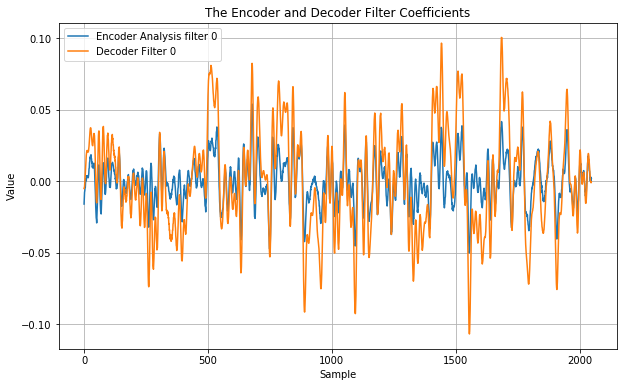

In [ ]:
"""
torch.save({#'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict()}, "audio_autoenc.torch")
"""

ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,6))
plt.plot(np.transpose(np.array(ww['conv1.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

predictions.shape= (1, 1, 881666)


C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


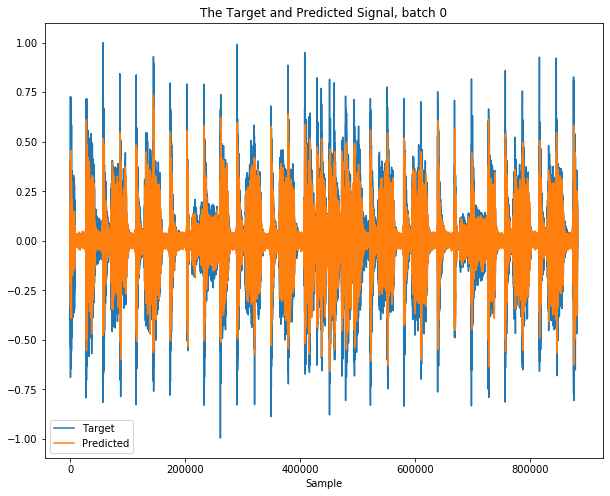

In [ ]:
#Test on training set:
Xnoise=(X_train+torch.randn(X_train.size())*0.05)
#Xnoise=torch.cat((torch.zeros(1,1,100), Xnoise),dim=-1)
predictions=model(Xnoise).cpu() # Make Predictions based on the obtained weights, on training set
predictions=predictions.detach()
predictions=np.array(predictions)
Y=np.array(Y) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2
#Plot target signal and output of autoencoder:
plt.figure(figsize=(10,8))
for b in range(batch):
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.show()

Xnoise=Xnoise.detach()
Xnoise=np.array(Xnoise)
xnoise=Xnoise[:,0,:]
#xnoise=np.transpose(xnoise)
#xnoise=np.clip(xnoise, -1.0,1.0)

xrek=predictions[:,0,:]  #remove unnecessary dimension for playback
#xrek=np.transpose(xrek)
#xrek=np.clip(xrek, -1.0,1.0)




In [ ]:
import IPython.display as ipd
display(ipd.Audio(xnoise, rate=samplerate));

In [ ]:
import IPython.display as ipd
display(ipd.Audio(xrek, rate=samplerate));

Observe that there is now a bigger difference to the original.

Observe that the reconstructed version sounds very muffled.

C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


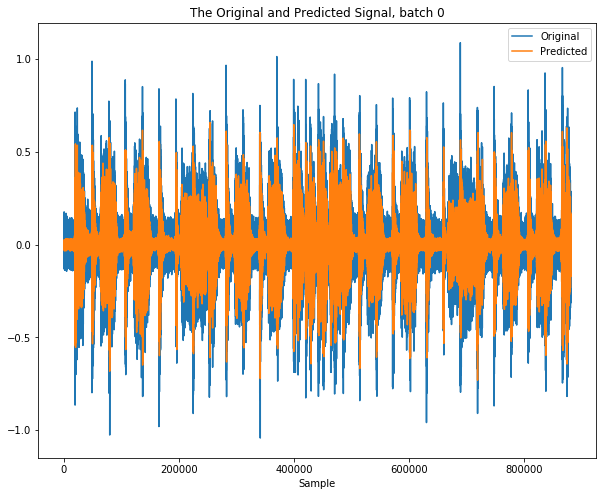

In [ ]:
#Test on Verification set:
X_test_shifted_100 = nn.ConstantPad1d(100, 0)(X_test)
x=X_test_shifted_100+torch.from_numpy((np.random.normal(scale=0.04, size=X_test_shifted_100.shape))).float()
predictions=model(x).cpu() # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)

plt.figure(figsize=(10,8))
for b in range(batch):
    plt.plot(np.array(x[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Original','Predicted'))
    plt.title('The Original and Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.show()
xrek=predictions[:,0,:]

In [ ]:
display(ipd.Audio(x[:,0,:], rate=samplerate));

In [ ]:
display(ipd.Audio(xrek, rate=samplerate));

**Observe** that here the difference is similar.

**Observe** that it is similarly muffled.

At least the shift sensitivity is not there because of the way we trained it.

## Expriment 2 with Reduced stride=32

In [ ]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/M4e9YcSUSsU?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

To obtain a better audio quality we now reduce the stride (the downsampling and upsampling factor) to 32.

In [ ]:
class Convautoenc(nn.Module):
    def __init__(self):
        super(Convautoenc, self).__init__()
        #Analysis Filterbank with downsampling of N=1024, filter length of 2N, but only N/2 outputs:
        self.conv1=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=2048, stride=32, padding=1023, bias=True) #Padding for 'same' filters (kernel_size/2-1)

        #Synthesis filter bank:
        self.synconv1=nn.ConvTranspose1d(in_channels=32, out_channels=1, kernel_size=2048, stride=32, padding=1023, bias=True)

    def encoder(self, x):
        #Analysis:
        x = self.conv1(x)
        y = torch.tanh(x)
        return y

    def decoder(self, y):
        #Synthesis:
        xrek= self.synconv1(y)
        return xrek

    def forward(self, x):
        y=self.encoder(x)
        #y=torch.round(y/0.125)*0.125
        xrek=self.decoder(y)
        return xrek

In [ ]:
batch=1
audio, samplerate = librosa.load("./audio/ACDC - Back In Black Intro.wav", mono=False, sr=None, offset=6)
audio[0,:]/=np.abs(audio[0,:]).max()
audio[1,:]/=np.abs(audio[1,:]).max()
X_train=signal2pytorch(audio[0,:]).to(device) #Convert to pytorch format, batch is first dimension
X_test=signal2pytorch(audio[1,:]).to(device) #Convert to pytorch format, batch is first dimension

In [ ]:
print("Generate Model:")
model = Convautoenc().to(device)
print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
print("Def. loss function:")
loss_fn = nn.MSELoss()  #MSE
#loss_fn = nn.L1Loss()

Ypred=model(X_train)

#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)

Y=X_train[:,:,:outputlen]  #the target signal with same length as model output

print("Input X.shape=", X_train.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())

Generate Model:
Total number of parameters: 131105
Def. loss function:
outputlen= 881986
Input X.shape= torch.Size([1, 1, 882000])
Target Y.shape= torch.Size([1, 1, 881986])
Target Y= tensor([[[-0.0021,  0.0010,  0.0031,  ...,  0.0486,  0.0698,  0.1591]]])
Y.type()= torch.FloatTensor


In [ ]:
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
""";

#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
Ypred=model(X_train)
#Ypred=Ypred.detach()
print("Ypred=", Ypred)

#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

if randdir==True:
#optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X_train, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(4000):
        #distortions: shift and noise:
        #"""
        Xlast=X_train[:,:,-1].clone()
        X_train[:,:,1:]=X_train[:,:,:-1].clone() #round Robbin, shift 1 right
        X_train[:,:,0]=Xlast.clone()
        Ylast=Y[:,:,-1].clone()
        Y[:,:,1:]=Y[:,:,:-1].clone() #round Robbin, shift 1 right
        Y[:,:,0]=Ylast.clone()
        #"""
        Ypred=model(X_train+torch.randn(X_train.size())*0.05)
        #print("Ypred.shape=", Ypred.shape)
        #loss wants batch in the beginning! (Batch, Classes,...)
        #Ypredp=Ypred.permute(1,2,0)
        #Yp=Y.permute(1,0)
        #print("Ypredp.shape=", Ypredp.shape, "Yp.shape=", Yp.shape )
        loss=loss_fn(Ypred, Y)
        if epoch%10==0:
            print(epoch, loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

Ypred= tensor([[[-0.0033, -0.0002,  0.0046,  ...,  0.0391, -0.0435, -0.0213]]],
       grad_fn=<SqueezeBackward1>)
0 0.014300710521638393
10 0.009008136577904224
20 0.006939592305570841
30 0.0058265551924705505
40 0.005075082182884216
50 0.004510106053203344
60 0.00407306756824255
70 0.0037410722579807043
80 0.0034488767851144075
90 0.0032003598753362894
100 0.002989207860082388
110 0.0028024143539369106
120 0.0026300791651010513
130 0.002487718127667904
140 0.0023449468426406384
150 0.0022305361926555634
160 0.002120385877788067
170 0.002020891522988677
180 0.001933859777636826
190 0.0018590528052300215
200 0.001780203776434064
210 0.0017224083421751857
220 0.0016510867280885577
230 0.0016055006999522448
240 0.0015529284719377756
250 0.0015061964513733983
260 0.0014659625012427568
270 0.0014295435976237059
280 0.0013947166735306382
290 0.0013702120631933212
300 0.0013330921065062284
310 0.0013076115865260363
320 0.0012794925132766366
330 0.0012558576418086886
340 0.0012355637736618519

3060 0.000784165458753705
3070 0.0007861327612772584
3080 0.000784766161814332
3090 0.0007832447299733758
3100 0.0007844422361813486
3110 0.0007833408890292048
3120 0.0007833763957023621
3130 0.0007809809758327901
3140 0.0007825922220945358
3150 0.0007787299691699445
3160 0.0007790154195390642
3170 0.0007790951640345156
3180 0.0007780605810694396
3190 0.0007791536627337337
3200 0.0007798027363605797
3210 0.0007799086160957813
3220 0.0007826162036508322
3230 0.000777379609644413
3240 0.0007824343047104776
3250 0.0007776840939186513
3260 0.0007798446458764374
3270 0.0007818570593371987
3280 0.0007813585689291358
3290 0.0007816891884431243
3300 0.000776884553488344
3310 0.0007790657691657543
3320 0.0007831437396816909
3330 0.0007825514185242355
3340 0.0007817543810233474
3350 0.0007781960302963853
3360 0.0007815049611963332
3370 0.0007808664813637733
3380 0.0007822723127901554
3390 0.0007801890023984015
3400 0.0007792816613800824
3410 0.0007834361749701202
3420 0.0007827156805433333
3430 

First you will notice that it trains or optimizes much slower, because it has to process more data.

ww= OrderedDict([('conv1.weight', tensor([[[ 0.0059,  0.0023,  0.0115,  ...,  0.0018,  0.0013,  0.0026]],

        [[ 0.0021, -0.0008, -0.0045,  ...,  0.0094,  0.0151,  0.0064]],

        [[ 0.0038,  0.0030, -0.0062,  ..., -0.0039, -0.0003, -0.0014]],

        ...,

        [[ 0.0011,  0.0045,  0.0162,  ..., -0.0033, -0.0118, -0.0068]],

        [[-0.0040, -0.0102, -0.0102,  ..., -0.0016, -0.0097, -0.0105]],

        [[ 0.0114,  0.0059, -0.0164,  ..., -0.0242, -0.0256, -0.0177]]])), ('conv1.bias', tensor([ 0.0085, -0.0147,  0.0171, -0.0078, -0.0117,  0.0106,  0.0041,  0.0143,
         0.0147, -0.0090,  0.0055, -0.0066, -0.0148, -0.0037,  0.0027, -0.0110,
        -0.0072, -0.0170,  0.0119, -0.0007, -0.0019,  0.0107, -0.0052,  0.0081,
        -0.0116, -0.0155, -0.0059,  0.0139,  0.0016,  0.0103, -0.0094, -0.0058])), ('synconv1.weight', tensor([[[ 0.0080,  0.0160,  0.0161,  ..., -0.0051, -0.0033, -0.0015]],

        [[ 0.0030, -0.0055, -0.0125,  ...,  0.0146,  0.0183,  0.0134]],

        

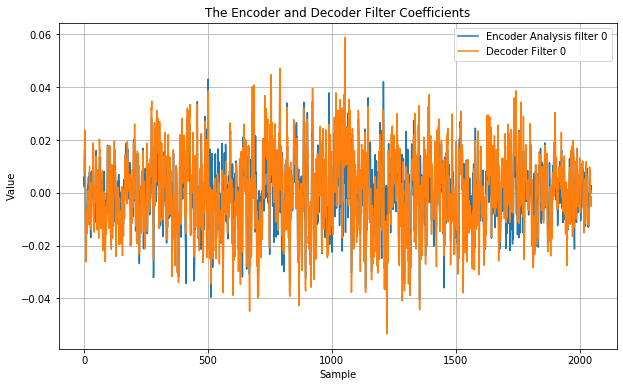

In [ ]:
"""
torch.save({#'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict()}, "audio_autoenc.torch")
"""

ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,6))
plt.plot(np.transpose(np.array(ww['conv1.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

predictions.shape= (1, 1, 881986)


C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


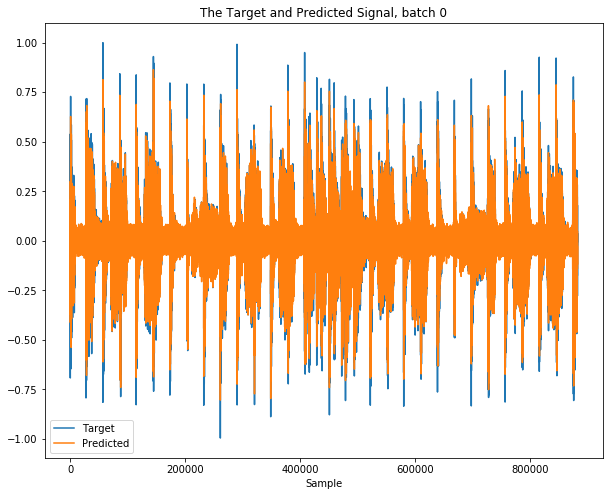

In [ ]:
#Test on training set:
Xnoise=(X_train+torch.randn(X_train.size())*0.05)
#Xnoise=torch.cat((torch.zeros(1,1,100), Xnoise),dim=-1)
predictions=model(Xnoise).cpu() # Make Predictions based on the obtained weights, on training set
predictions=predictions.detach()
predictions=np.array(predictions)
Y=np.array(Y) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2
#Plot target signal and output of autoencoder:
plt.figure(figsize=(10,8))
for b in range(batch):
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.show()

Xnoise=Xnoise.detach()
Xnoise=np.array(Xnoise)
xnoise=Xnoise[:,0,:]
#xnoise=np.transpose(xnoise)
#xnoise=np.clip(xnoise, -1.0,1.0)

xrek=predictions[:,0,:]  #remove unnecessary dimension for playback
#xrek=np.transpose(xrek)
#xrek=np.clip(xrek, -1.0,1.0)




In [ ]:
import IPython.display as ipd
display(ipd.Audio(xnoise, rate=samplerate));

In [ ]:
import IPython.display as ipd
display(ipd.Audio(xrek, rate=samplerate));

C:\Miniconda3\envs\TU_Tutorials\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


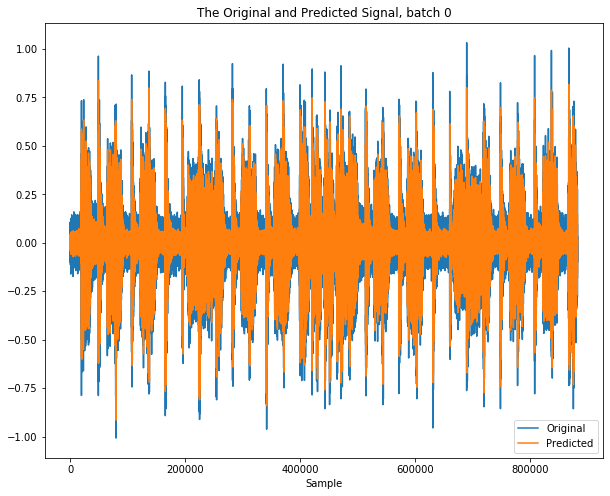

In [ ]:
#Test on Verification set:
X_test_shifted_100 = nn.ConstantPad1d(100, 0)(X_test)
x=X_test_shifted_100+torch.from_numpy((np.random.normal(scale=0.04, size=X_test_shifted_100.shape))).float()
predictions=model(x).cpu() # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)

plt.figure(figsize=(10,8))
for b in range(batch):
    plt.plot(np.array(x[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Original','Predicted'))
    plt.title('The Original and Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.show()
xrek=predictions[:,0,:]

In [ ]:
display(ipd.Audio(x[:,0,:], rate=samplerate));

In [ ]:
display(ipd.Audio(xrek, rate=samplerate));

But when it finally plays back the reconstructed versions of the training and verification set, you can hear that the signals indeed sound a bit better, less muffled!

This shows the effect of the stride: Too low means long training, too high means less quality.